### When you run this program (Run all cells):
* Each cell will generate a KPI chart

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import math
import numpy as np

property_listings_df = pd.read_csv('data/airbnb_dfw_property_listings.csv')

# Objective 1: Room type market distribution
# get room type distribution for each city
room_type_by_market_df = property_listings_df.groupby(['city', 'room_type']).size()
room_type_by_market_df = room_type_by_market_df.groupby(level=0).apply(lambda x: round(100 * x / float(x.sum())))
room_type_by_market_df = room_type_by_market_df.reset_index()
room_type_by_market_df.rename(columns={0: 'pct'}, inplace=True)
# remove rows that are less than 10 pct
room_type_by_market_df = room_type_by_market_df.drop(room_type_by_market_df[room_type_by_market_df.pct < 10].index)
room_type_by_market_df.reset_index(drop=True, inplace=True)
room_type_by_market_df.sort_values(["pct", "city"], inplace=True, ascending = (False, True))
room_type_by_market_df.to_csv(r'data/room_type_distribution.csv', index = False)

# Plot room type distribution
room_type_by_market_df.groupby(['room_type']).size()
fig = px.bar(room_type_by_market_df, x="pct", y="city", color="room_type", orientation='h',
            title="Room Type Distribution", labels={"city": "City", "pct": "Percentage", "room_type": "Room Type"},
            color_discrete_sequence=["#3d5a80", "#ee6c4d"],
            text='pct')
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    ticksuffix="%", showgrid=True,
    titlefont_size=16
)
fig.update_yaxes(titlefont_size=16)
# fig.update_traces(texttemplate='%{text:.f}%', textposition='outside')
fig.update_layout(uniformtext_minsize=7, uniformtext_mode='hide')
fig.show()
room_type_by_market_df

,city,room_type,pct
2,Dallas,Entire home/apt,83.0
6,Fort-Worth,Entire home/apt,77.0
0,Arlington,Entire home/apt,73.0
16,Plano,Entire home/apt,69.0
14,McKinney,Entire home/apt,68.0
8,Frisco,Entire home/apt,62.0
10,Grand Prairie,Entire home/apt,57.0
19,Richardson,Private room,55.0
4,Denton,Entire home/apt,52.0
12,Irving,Entire home/apt,51.0


In [2]:
# Objective 2: Property type market distribution
# get property type distribution for each city
property_type_df = property_listings_df.groupby(['city', 'property_type']).size()
property_type_df = property_type_df.groupby(level=0).apply(lambda x: round(100 * x / float(x.sum())))
property_type_df = property_type_df.reset_index()
property_type_df.rename(columns={0: 'pct'}, inplace=True)
# remove rows that are less than 9 pct - Grand Prairie Apartments at 9pct 11/20/20
property_type_df = property_type_df.drop(property_type_df[property_type_df.pct < 9].index)
property_type_df.reset_index(drop=True, inplace=True)
property_type_df.sort_values(["pct", "city"], inplace=True, ascending = (False, True))

# Plot property type distribution
property_type_df.groupby(['property_type']).size()
fig = px.bar(property_type_df, x="pct", y="city", color="property_type", orientation='h',
            title="Property Type Distribution",
            labels={"city": "City", "pct": "Percentage", "property_type": "Property Type"},
            color_discrete_sequence=["#5390d9", "#6b818c"])
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    ticksuffix="%", showgrid=True,
    titlefont_size=16
)
fig.update_yaxes(titlefont_size=16)
# fig.update_traces(texttemplate='%{text:.f}%', textposition='outside')
# fig.update_layout(uniformtext_minsize=7, uniformtext_mode='hide')
fig.show()
property_type_df
# How do I highlight Dallas apartment bar?
# - maybe combine two plots, plot 1 has all but Dallas, plot 2 has only Dallas then can control color sequence separately

,city,property_type,pct
11,Grand Prairie,House,72.0
19,Richardson,House,68.0
9,Frisco,House,63.0
5,Denton,House,59.0
13,Irving,House,54.0
1,Arlington,House,48.0
15,McKinney,House,47.0
17,Plano,House,47.0
2,Dallas,Apartment,43.0
7,Fort-Worth,House,42.0


In [3]:
# Objective 3: Market occupancy rate
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_metrics.csv')
occupancy_rate_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
occupancy_rate_df.sort_values(["Occupancy Rate %", "Market"], inplace=True, ascending = (False, True))
occupancy_rate_df.rename(columns={"Occupancy Rate %": "occupancy_rate"}, inplace=True)

# property_type_df.groupby(['property_type']).size()
fig = px.bar(occupancy_rate_df, x="occupancy_rate", y="Market", orientation='h',
            title="Annual Occupancy Rate",
            labels={"Market": "City", "occupancy_rate": "Occupancy Rate"},
            color_discrete_sequence=["#118ab2"],
            text='occupancy_rate')
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    ticksuffix="%", showgrid=True,
    titlefont_size=16
)
fig.update_yaxes(titlefont_size=16)
fig.update_traces(texttemplate='%{text:.f}%', textposition='outside')
fig.update_layout(uniformtext_minsize=7, uniformtext_mode='hide')
fig.show()
occupancy_rate_df

,Market,occupancy_rate
7,McKinney,68
0,Dallas,65
8,Denton,65
6,Grand Prairie,65
9,Richardson,65
5,Frisco,63
3,Irving,63
2,Plano,62
1,Fort-Worth,58
4,Arlington,55


In [4]:
# Objective 4: Average daily rate
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_metrics.csv')
airdna_stats_df
average_daily_rate_df = airdna_stats_df.filter(['Market', 'Average Daily Rate'])
average_daily_rate_df.sort_values(["Average Daily Rate", "Market"], inplace=True, ascending = (False, True))
average_daily_rate_df.rename(columns={"Average Daily Rate": "average_daily_rate"}, inplace=True)

# property_type_df.groupby(['property_type']).size()
fig = px.bar(average_daily_rate_df, x="average_daily_rate", y="Market", orientation='h',
            title="Average Daily Rate",
            labels={"Market": "City", "average_daily_rate": "Average Daily Rate"},
            color_discrete_sequence=["#83c5be"],
            text='average_daily_rate')
fig.update_layout(barmode='group')
fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_xaxes(
    tickprefix="$", showgrid=True,
    titlefont_size=16,
)
fig.update_yaxes(titlefont_size=16)
fig.update_traces(texttemplate='%{text:$.f}', textposition='outside')
fig.update_layout(uniformtext_minsize=7, uniformtext_mode='hide')
fig.show()
average_daily_rate_df

,Market,average_daily_rate
5,Frisco,166
4,Arlington,160
6,Grand Prairie,153
7,McKinney,145
2,Plano,145
1,Fort-Worth,135
9,Richardson,132
3,Irving,130
0,Dallas,125
8,Denton,100


In [5]:
# Objective 5: Annual Projected Revenue
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_metrics.csv')
# airdna_stats_df = airdna_stats_df.filter(['Market', 'Active Rentals', 'Average Daily Rate', 'Occupancy Rate %', 'Monthly Revenue', 'Rental Activity Property Count'])
airdna_stats_df.rename(columns={"Active Rentals": "active_rentals",
                                 "Rental Demand Score": "rental_demand_score",
                                 "Average Daily Rate": "average_daily_rate",
                                 "Occupancy Rate %": "occupancy_rate",
                                 "Monthly Revenue": "monthly_revenue",
                                 "Rental Activity Property Count": "rental_activity_property_count"}, inplace=True)
airdna_stats_df['annual_revenue'] = airdna_stats_df.average_daily_rate * 365 * (airdna_stats_df.occupancy_rate/100) * airdna_stats_df.rental_activity_property_count
airdna_stats_df['annual_revenue_str'] = round(airdna_stats_df['annual_revenue']/1000000, 1)
airdna_stats_df['annual_revenue_str'] = airdna_stats_df['annual_revenue_str'].astype(str) 
airdna_stats_df['annual_revenue_str'] = airdna_stats_df['annual_revenue_str'] + 'M'

fig = px.scatter(airdna_stats_df, x="annual_revenue", y="active_rentals",
                 labels={"annual_revenue": "Revenue", "active_rentals": "Active Rentals"},
                 size="annual_revenue", text=airdna_stats_df.annual_revenue_str,
                 color="Market", hover_name="annual_revenue_str", title="Annual Projected Revenue",
                 log_x=True, size_max=80)
fig.update_traces(hovertemplate=None)
fig.update_layout(hovermode="x")
fig.show()
airdna_stats_df = airdna_stats_df.filter(['Market', 'active_rentals', 'annual_revenue', 'annual_revenue_str', 'annual_revenue_str2'])
airdna_stats_df

,Market,active_rentals,annual_revenue,annual_revenue_str
0,Dallas,3605,52936406.25,52.9M
1,Fort-Worth,1119,17347756.50,17.3M
2,Plano,459,5086092.50,5.1M
3,Irving,369,3377965.50,3.4M
4,Arlington,339,4625280.00,4.6M
5,Frisco,183,3091907.70,3.1M
6,Grand Prairie,166,2141655.75,2.1M
7,McKinney,169,2231318.00,2.2M
8,Denton,122,569400.00,0.6M
9,Richardson,97,2129556.00,2.1M


In [6]:
# Objective 6: Annual projected revenue by room type
# revenue calc is adr * occupancy_rate * 365 days
property_listings_df = pd.read_csv('data/airbnb_dfw_property_listings.csv')
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_metrics.csv')

airdna_stats_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
airdna_stats_df.rename(columns={"Occupancy Rate %": "occupancy_rate", "Market": "city"}, inplace=True)

property_listings_df = property_listings_df.filter(['room_type', 'city', 'average_daily_rate'])
property_listings_df['average_daily_rate'] = property_listings_df['average_daily_rate'].str.replace(',', '').apply(pd.to_numeric)
property_listings_df = property_listings_df.groupby(['room_type', 'city']).mean().round().reset_index()

entire_home_df = property_listings_df[property_listings_df['room_type'] == 'Entire home/apt']
private_rm_df = property_listings_df[property_listings_df['room_type'] == 'Private room']
property_listings_df = entire_home_df.append(private_rm_df)

property_listings_df = pd.merge(property_listings_df, airdna_stats_df, on='city')
property_listings_df['annual_gross_revenue'] = (property_listings_df.average_daily_rate * (property_listings_df.occupancy_rate/100) * 365).round()

room_type_by_market_df = pd.read_csv('data/room_type_distribution.csv')
room_type_with_market_share_df = pd.merge(property_listings_df, room_type_by_market_df, left_on=['city','room_type'], right_on = ['city','room_type'])
room_type_with_market_share_df['adj_annual_gross_revenue'] = (room_type_with_market_share_df.average_daily_rate * (room_type_with_market_share_df.occupancy_rate/100) * (room_type_with_market_share_df.pct/100) * 365).round()
# room_type_with_market_share_df.sort_values(["adj_annual_gross_revenue", "city"], inplace=True, ascending = (False, True))

# Objective 7: Annual projected revenue by room type with adjusted traditional rental revenue
room_type_with_market_share_df.sort_values(["city"], inplace=True, ascending = (True))
traditional_annual_rental_revenue = pd.read_csv('data/traditional_annual_rental_revenue.csv')

fig = px.bar(room_type_with_market_share_df, y="adj_annual_gross_revenue", x="city", color="room_type",
             title="Annual Projected Revenue By Room Type",
             labels={"city": "City", "room_type": "Room Type", 
                     "adj_annual_gross_revenue": "Revenue"},
             color_discrete_sequence=["#3d5a80", "#ee6c4d"],
             text='adj_annual_gross_revenue')
trace1 = go.Scatter(x=traditional_annual_rental_revenue["Market"], y=traditional_annual_rental_revenue["adjusted_annual_revenue"],
                    name='Adj. Traditional Rental Revenue')
fig.update_layout(barmode='group')
fig.update_yaxes(
    tickprefix="$", showgrid=True
)
# fig.update_yaxes(titlefont_size=16)
fig.update_traces(texttemplate='%{value:$,s, .1}', textposition='inside')
# fig.update_layout(uniformtext_minsize=7, uniformtext_mode='hide')
fig.add_trace(trace1)
fig.show()
room_type_with_market_share_df
# traditional_annual_rental_revenue

,room_type,city,average_daily_rate,occupancy_rate,annual_gross_revenue,pct,adj_annual_gross_revenue
0,Entire home/apt,Arlington,179.0,55,35934.0,73.0,26232.0
1,Private room,Arlington,68.0,55,13651.0,25.0,3413.0
2,Entire home/apt,Dallas,155.0,65,36774.0,83.0,30522.0
3,Private room,Dallas,68.0,65,16133.0,16.0,2581.0
4,Entire home/apt,Denton,141.0,65,33452.0,52.0,17395.0
5,Private room,Denton,55.0,65,13049.0,46.0,6002.0
6,Entire home/apt,Fort-Worth,160.0,58,33872.0,77.0,26081.0
7,Private room,Fort-Worth,55.0,58,11644.0,22.0,2562.0
9,Private room,Frisco,53.0,63,12187.0,38.0,4631.0
8,Entire home/apt,Frisco,194.0,63,44610.0,62.0,27658.0


In [7]:
traditional_annual_rental_revenue

,Market,adjusted_annual_revenue
0,Arlington,8504.870
1,Dallas,12549.810
2,Denton,10624.770
3,Fort-Worth,9644.356
4,Frisco,12627.090
5,Grand Prairie,11229.010
6,Irving,11956.266
7,McKinney,11999.416
8,Plano,12211.024
9,Richardson,12373.400


In [8]:
# Objective 7: Annual projected revenue by property type
property_listings_df = pd.read_csv('data/airbnb_dfw_property_listings.csv')
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_metrics.csv')

airdna_stats_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
airdna_stats_df.rename(columns={"Occupancy Rate %": "occupancy_rate", "Market": "city"}, inplace=True)

property_listings_df = property_listings_df.filter(['property_type', 'city', 'average_daily_rate'])
property_listings_df['average_daily_rate'] = property_listings_df['average_daily_rate'].str.replace(',', '').apply(pd.to_numeric)
property_listings_df = property_listings_df.groupby(['property_type', 'city']).mean().round().reset_index()

apartments_df = property_listings_df[property_listings_df['property_type'] == 'Apartment']
houses_df = property_listings_df[property_listings_df['property_type'] == 'House']
property_listings_df = houses_df.append(apartments_df)

property_listings_df = pd.merge(property_listings_df, airdna_stats_df, on='city')
property_listings_df['annual_gross_revenue'] = (property_listings_df.average_daily_rate * (property_listings_df.occupancy_rate/100) * 365).round()
property_listings_df.sort_values(["annual_gross_revenue", "city"], inplace=True, ascending = (False, True))

# fig = px.bar(property_listings_df, x="annual_gross_revenue", y="city", color="property_type", orientation='h',
#             title="Annual Projected Revenue By Property Type",
#              labels={"city": "City", "pct": "Percentage", "property_type": "Property Type", 
#                      "annual_gross_revenue": "Revenue"},
#             color_discrete_sequence=["#5390d9", "#6b818c"]
#             )
# fig.update_layout(barmode='group')
# fig['layout']['yaxis']['autorange'] = "reversed"
# fig.update_xaxes(
#     tickprefix="$", showgrid=True
# )
# fig.show()
# property_listings_df

# DGitonga 8/20/20 - This chart was excluded because it misguides you into thinking that houses will generate more cashflow.
# Dallas has 49% apartments and 24% houses, this chart suggests houses make more cashflow due to a higher adr. The data we
# see in other charts suggests that apartments make more cashflow in this market.

In [9]:
# Objective 8: Bedroom market share
property_listings_df = pd.read_csv('data/airbnb_dfw_property_listings.csv')
property_listings_df = property_listings_df.drop(property_listings_df[property_listings_df.bedrooms > 5].index)
property_listings_df = property_listings_df.groupby(['city', 'bedrooms']).size().to_frame('market_share')

# Save market share csv
property_listings_df2 = property_listings_df.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))
property_listings_df2 = property_listings_df2.reset_index()
property_listings_df2.to_csv(r'data/dfw_bedroom_market_share.csv', index = False)
# property_listings_df2

property_listings_df = property_listings_df.groupby(level=0).apply(lambda x: round(100 * x / float(x.sum())))
# property_listings_df.sort_values(["pct", "city"], inplace=True, ascending = (False, True))
property_listings_df = property_listings_df.reset_index()
# property_listings_df = property_listings_df[property_listings_df['pct'] > 11]
property_listings_df['bedrooms'] = property_listings_df['bedrooms'].astype(str).replace('0', 'Studio')
fig = px.bar(property_listings_df, x="market_share", y="city", color="bedrooms", orientation='h',
             title="Bedroom Market Share",
             labels={"city": "City", "bedrooms": "Bedrooms", "market_share":"Market Share"},
             color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
             text='market_share')

fig.update_layout(
    xaxis=dict(
        titlefont_size=16,
        ticksuffix="%", showgrid=True
    ),
    yaxis=dict(
        titlefont_size=16,
        autorange="reversed"
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.0,
        xanchor="right",
        x=0.99
    ),
    barmode='stack',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.update_traces(texttemplate='%{value:s}%', textposition='inside')
fig.show()
property_listings_df

,city,bedrooms,market_share
0,Arlington,Studio,2.0
1,Arlington,1,47.0
2,Arlington,2,20.0
3,Arlington,3,19.0
4,Arlington,4,8.0
5,Arlington,5,4.0
6,Dallas,Studio,7.0
7,Dallas,1,62.0
8,Dallas,2,19.0
9,Dallas,3,8.0


In [10]:
# Objective 9: Projected revenue by # of bedrooms
property_listings_df = pd.read_csv('data/airbnb_dfw_property_listings.csv')
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_metrics.csv')
bedroom_market_share_df = pd.read_csv('data/dfw_bedroom_market_share.csv')

airdna_stats_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
airdna_stats_df.rename(columns={"Occupancy Rate %": "occupancy_rate", "Market": "city"}, inplace=True)

market_share_df = property_listings_df.filter(['bedrooms', 'city', 'average_daily_rate'])
market_share_df['average_daily_rate'] = market_share_df['average_daily_rate'].str.replace(',', '').apply(pd.to_numeric)
market_share_df = market_share_df.groupby(['bedrooms', 'city']).mean().round().reset_index()
market_share_df = market_share_df.drop(market_share_df[market_share_df.bedrooms > 5].index)
market_share_df = pd.merge(market_share_df, bedroom_market_share_df, left_on=['city','bedrooms'], right_on = ['city','bedrooms'])
market_share_df = pd.merge(market_share_df, airdna_stats_df, on='city')
market_share_df.rename(columns={"pct": "market_share"}, inplace=True)
market_share_df['annual_gross_revenue'] = (market_share_df.average_daily_rate * (market_share_df.market_share/100) * (market_share_df.occupancy_rate/100) * 365).round()
market_share_df['bedrooms'] = market_share_df['bedrooms'].astype(str).replace('0', 'Studio')
fig = px.bar(market_share_df, y="annual_gross_revenue", x="city", color="bedrooms", 
             title="Annual Revenue Forecast By # of Bedrooms",
             labels={"city": "City", "bedrooms": "Bedrooms", 
                     "annual_gross_revenue": "Revenue"},
             color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
             category_orders={"bedrooms": ["Studio", "1", "2", "3", "4", "5"]}
            )
fig.update_layout(barmode='group')
# fig['layout']['yaxis']['autorange'] = "reversed"
fig.update_yaxes(
#     tickprefix="$", showgrid=True
)
fig.update_layout(
    xaxis=dict(
        titlefont_size=16,
    ),
    yaxis=dict(
        titlefont_size=16,
        tickprefix="$", showgrid=True
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.0,
        xanchor="right",
        x=0.99
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()
market_share_df
# market_share_df.sort_values(["annual_gross_revenue", "city"], inplace=True, ascending = (False, True))

,bedrooms,city,average_daily_rate,market_share,occupancy_rate,annual_gross_revenue
0,Studio,Arlington,105.0,2.199413,55,464.0
1,1,Arlington,66.0,46.627566,55,6178.0
2,2,Arlington,131.0,19.648094,55,5167.0
3,3,Arlington,207.0,18.768328,55,7799.0
4,4,Arlington,277.0,8.357771,55,4648.0
5,5,Arlington,473.0,4.398827,55,4177.0
6,Studio,Dallas,84.0,6.800766,65,1355.0
7,1,Dallas,84.0,62.132822,65,12382.0
8,2,Dallas,144.0,18.805875,65,6425.0
9,3,Dallas,253.0,8.014049,65,4810.0


In [11]:
# Objective 10: Traditional rental prices by bedroom type
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_metrics.csv')
occupancy_rate_df = airdna_stats_df.filter(['Market', 'Occupancy Rate %'])
occupancy_rate_df.sort_values(["Occupancy Rate %", "Market"], inplace=True, ascending = (False, True))
occupancy_rate_df.rename(columns={"Occupancy Rate %": "occupancy_rate"}, inplace=True)

# Studio traditional rental prices
dfw_studio = pd.read_csv('data/datasets/zillow_rental_datasets/DFW_MedianRentalPrice_Studio.csv')
dfw_studio = pd.merge(dfw_studio, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
market_Last_12_Month_Avg = dfw_studio["Last 12 Month Avg"].mean()
dfw_studio["Last 12 Month Avg"].fillna(market_Last_12_Month_Avg, inplace = True)
dfw_studio['annual_revenue'] = round(dfw_studio['Last 12 Month Avg'] * 12)
dfw_studio['adjusted_annual_revenue'] = dfw_studio['annual_revenue'] * (dfw_studio['occupancy_rate']/100)
dfw_studio.sort_values(["Market"], inplace=True, ascending = (True))
dfw_studio

# 1 Bedroom traditional rental prices
dfw_1_bedroom = pd.read_csv('data/datasets/zillow_rental_datasets/DFW_MedianRentalPrice_1Bedroom.csv')
dfw_1_bedroom = pd.merge(dfw_1_bedroom, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
dfw_1_bedroom['annual_revenue'] = round(dfw_1_bedroom['Last 12 Month Avg'] * 12)
dfw_1_bedroom['adjusted_annual_revenue'] = dfw_1_bedroom['annual_revenue'] * (dfw_1_bedroom['occupancy_rate']/100)
dfw_1_bedroom.sort_values(["RegionName"], inplace=True, ascending = (True))
dfw_1_bedroom

# 2 Bedroom traditional rental prices
dfw_2_bedroom = pd.read_csv('data/datasets/zillow_rental_datasets/DFW_MedianRentalPrice_2Bedroom.csv')
dfw_2_bedroom = pd.merge(dfw_2_bedroom, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
market_Last_12_Month_Avg = dfw_2_bedroom["Last 12 Month Avg"].mean()
dfw_2_bedroom["Last 12 Month Avg"].fillna(market_Last_12_Month_Avg, inplace = True)
dfw_2_bedroom['annual_revenue'] = round(dfw_2_bedroom['Last 12 Month Avg'] * 12)
dfw_2_bedroom['adjusted_annual_revenue'] = dfw_2_bedroom['annual_revenue'] * (dfw_2_bedroom['occupancy_rate']/100)
dfw_2_bedroom.sort_values(["RegionName"], inplace=True, ascending = (True))
dfw_2_bedroom

# 3 Bedroom traditional rental prices
dfw_3_bedroom = pd.read_csv('data/datasets/zillow_rental_datasets/DFW_MedianRentalPrice_3Bedroom.csv')
dfw_3_bedroom = pd.merge(dfw_3_bedroom, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
market_Last_12_Month_Avg = dfw_3_bedroom["Last 12 Month Avg"].mean()
dfw_3_bedroom["Last 12 Month Avg"].fillna(market_Last_12_Month_Avg, inplace = True)
dfw_3_bedroom['annual_revenue'] = round(dfw_3_bedroom['Last 12 Month Avg'] * 12)
dfw_3_bedroom['adjusted_annual_revenue'] = dfw_3_bedroom['annual_revenue'] * (dfw_3_bedroom['occupancy_rate']/100)
dfw_3_bedroom.sort_values(["RegionName"], inplace=True, ascending = (True))
dfw_3_bedroom

# 4 Bedroom traditional rental prices
dfw_4_bedroom = pd.read_csv('data/datasets/zillow_rental_datasets/DFW_MedianRentalPrice_4Bedroom.csv')
dfw_4_bedroom = pd.merge(dfw_4_bedroom, occupancy_rate_df, left_on=['RegionName'], right_on = ['Market'], how='right')
market_Last_12_Month_Avg = dfw_4_bedroom["Last 12 Month Avg"].mean()
dfw_4_bedroom["Last 12 Month Avg"].fillna(market_Last_12_Month_Avg, inplace = True)
dfw_4_bedroom['annual_revenue'] = round(dfw_4_bedroom['Last 12 Month Avg'] * 12)
dfw_4_bedroom['adjusted_annual_revenue'] = dfw_4_bedroom['annual_revenue'] * (dfw_4_bedroom['occupancy_rate']/100)
dfw_4_bedroom.sort_values(["RegionName"], inplace=True, ascending = (True))
dfw_4_bedroom

# Combine all bedroom traditional rental prices
dfw_studio['bedrooms'] = 'Studio'
dfw_1_bedroom['bedrooms'] = 1
dfw_2_bedroom['bedrooms'] = 2
dfw_3_bedroom['bedrooms'] = 3
dfw_4_bedroom['bedrooms'] = 4
dfw_4_bedroom
all_dfw_df = pd.concat([dfw_studio, dfw_1_bedroom, dfw_2_bedroom, dfw_3_bedroom, dfw_4_bedroom])
all_dfw_df = all_dfw_df.filter(['Market', 'adjusted_annual_revenue', 'bedrooms'])
all_dfw_df

,Market,adjusted_annual_revenue,bedrooms
9,Arlington,9125.60,Studio
0,Dallas,9176.70,Studio
3,Denton,10784.80,Studio
8,Fort-Worth,9623.36,Studio
6,Frisco,10452.96,Studio
4,Grand Prairie,10784.80,Studio
7,Irving,10452.96,Studio
2,McKinney,11282.56,Studio
1,Plano,11820.30,Studio
5,Richardson,10784.80,Studio


In [12]:
# Objective 11: Average traditional rental prices by bedroom type
all_dfw_df = all_dfw_df.groupby(['Market']).mean().reset_index()
all_dfw_df.to_csv(r'data/traditional_annual_rental_revenue.csv', index = False)
all_dfw_df

,Market,adjusted_annual_revenue
0,Arlington,8504.870
1,Dallas,12549.810
2,Denton,10624.770
3,Fort-Worth,9644.356
4,Frisco,12627.090
5,Grand Prairie,11229.010
6,Irving,11956.266
7,McKinney,11999.416
8,Plano,12211.024
9,Richardson,12373.400


In [13]:
# Objective 12: Projected revenue by # of bedrooms vs average traditional rental revenue
fig = px.bar(market_share_df, y="annual_gross_revenue", x="city", color="bedrooms", 
             title="Annual Revenue Forecast By # of Bedrooms",
             labels={"city": "City", "bedrooms": "Bedrooms", 
                     "annual_gross_revenue": "Revenue"},
             color_discrete_sequence=["#264653", "#2a9d8f", "#73a9bf", "#e9c46a", "#e76f51", "#f4a261"],
             category_orders={"bedrooms": ["Studio", "1", "2", "3", "4", "5"]}
            )
fig.update_layout(barmode='group')
# fig.update_layout(showlegend=False)
fig.update_yaxes(
    tickprefix="$", showgrid=True
)
trace_1_bd = go.Scatter(x=all_dfw_df["Market"], y=all_dfw_df["adjusted_annual_revenue"],
                    name='Traditional Rental Revenue')

fig.add_trace(trace_1_bd)
fig.update_layout(
    xaxis=dict(
        titlefont_size=16,
    ),
    yaxis=dict(
        titlefont_size=16,
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.0,
        xanchor="right",
        x=0.99
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
# fig.add_trace(trace1)
fig.show()

In [14]:
# Objective 13: Quarterly growth
airdna_stats_df = pd.read_csv('data/airdna_dfw_market_metrics.csv')
df_2019 = airdna_stats_df.filter(['Market', 'Q1 19', 'Q2 19', 'Q3 19', 'Q4 19', '2019 Growth %', 'Q1 20', 'Q2 20', '2020 Growth %'])
df_2019_dallas = df_2019[df_2019.Market == 'Dallas']
df_2019_cowtown = df_2019[df_2019.Market == 'Fort-Worth']
df_2019_big_city = pd.concat([df_2019_dallas, df_2019_cowtown])

q1_color = '#edae49'
q2_color = '#3da5d9'
q3_color = '#7fb685'
q4_color = '#f4743b'

fig = go.Figure(
    data=[go.Bar(x=df_2019["Market"], y=df_2019['Q1 19'], name='Q1 19', marker_color=q1_color)],
    layout=go.Layout(
        title=go.layout.Title(text="Quarterly Growth"),
    )
)
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q2 19'],
        name='Q2 19', marker_color=q2_color
    ))
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q3 19'],
        name='Q3 19', marker_color=q3_color
    ))
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q4 19'],
        name='Q4 19', marker_color=q4_color
    ))
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q1 20'],
        name='Q1 20', marker_color=q1_color
    ))
fig.add_trace(
    go.Bar(
        x=df_2019["Market"],
        y=df_2019['Q2 20'],
        name='Q2 20', marker_color=q2_color
    ))
fig.update_layout(
    title='Quarterly Growth',
    xaxis=dict(
        title='Market',
        titlefont_size=16,
    ),
    yaxis=dict(
        title='# of Units',
        titlefont_size=16,
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=0.90,
        xanchor="right",
        x=0.99
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()
df_2019

,Market,Q1 19,Q2 19,Q3 19,Q4 19,2019 Growth %,Q1 20,Q2 20,2020 Growth %
0,Dallas,4524,4831,5118,5359,18,4850,4351,-10
1,Fort-Worth,1156,1235,1405,1534,33,1478,1371,-7
2,Plano,526,570,558,585,11,573,531,-7
3,Irving,417,445,468,538,29,525,503,-4
4,Arlington,538,557,581,590,10,522,475,-9
5,Frisco,252,289,274,282,12,253,241,-5
6,Grand Prairie,160,187,203,219,37,216,220,2
7,McKinney,206,211,239,227,10,202,197,-2
8,Denton,154,172,174,187,21,172,151,-12
9,Richardson,159,194,204,210,32,188,162,-14


In [15]:
# Objective 14: Density map of listings
property_listings_df = pd.read_csv('data/airbnb_dfw_property_listings.csv')

fig = px.density_mapbox(property_listings_df, lat='latitude', lon='longitude', radius=3.5,
                        center={'lat': 32.964012, 'lon': -97.043722}, zoom=9.0, height=850, width=950,
                        hover_data=['city', 'average_daily_rate', 'property_type'],
                        labels={"city": "City", "property_type": "Property Type", "average_daily_rate": "Avg Daily Rate"},
                        mapbox_style="open-street-map")
fig.update_layout(showlegend=True)
fig.show()

<function matplotlib.pyplot.show(*args, **kw)>

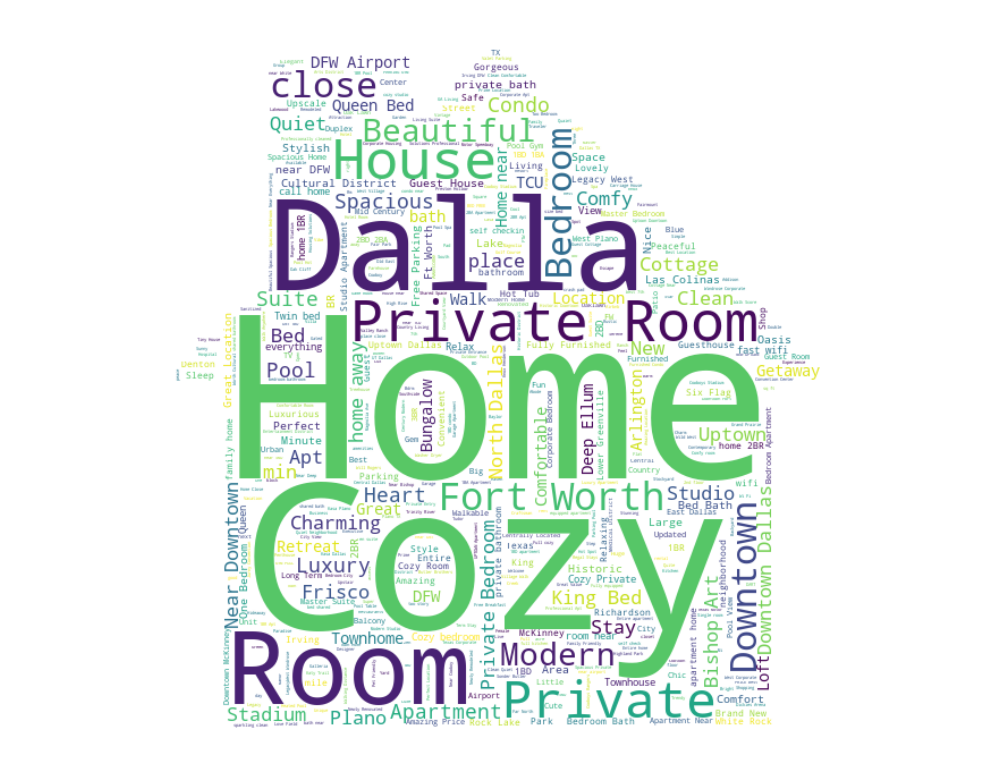

In [16]:
# Objective 15: Marketing keyword cloud
from os import path
from PIL import Image
from datetime import date
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

mask = np.array(Image.open("img/house.png"))
property_listings_df = pd.read_csv('data/airbnb_dfw_property_listings.csv')

titles = " ".join(title for title in property_listings_df.title)

# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=STOPWORDS, max_words=500, background_color="white", mask=mask, max_font_size=256,
               random_state=42, width=mask.shape[1],
               height=mask.shape[0]).generate(titles)

# store to file
datestamp = date.today().strftime("%Y%m%d")
wordcloud.to_file("img/house_word_cloud_{}.png".format(datestamp))

# Display the generated image:
plt.figure(figsize=[200,100])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show